In [14]:
# Grundgerüst Leistungsausweis
#Dieses Notebook soll euch als Grundgerüst für euren Leistungsnachweis dienen. Es soll euch eine Idee/ Hilfestellung bieten, wie man einen neuen Datensatz, basierend auf einer Fragestellung, strukturiert analysieren und interpretieren kann. Wie besagt, dient das Notebook als Hilfestellung, ist jedoch keinenfalls vollständig ausgeschöpft. In diesem Sinne dürft ihr auch gerne Sachen miteinbeziehen, welche hier nicht genannt werden. 

#-> Bitte schreibt die Antwort zu den jeweiligen Punkten an oberster Stelle unterhalb der Titel (so wie dies auch im Leistungsnachweisbeispiel gemacht wurde).


## Struktur
#1. Fragestellung(en) und Datenbeschaffung
#2. Daten laden
#3. Daten vorbereiten
#4. Statistik der Rohdaten (Generell im Longformat)
#5. Analyse der Daten

#  **Wichtig:** Alle graphischen Darstellungen sollten mindestens *Titel, Ticks- und Achsenbeschriftung* beinhalten (Siehe plots im Leistungsnachweisbeispiel)


## 1. Fragestellung(en) und Datenbeschaffung
### 1.1 Titel: 
Die Kindersterblichkeit ist global ab 1950 drastisch gefallen, viele Länder haben eine reduktion um 70-95% erreicht.

### 1.2 Fragestellung:

- Welche fünf markanten globalen „Brüche“ (Ausschläge und starke Rückgänge) in der Kindersterblichkeit lassen sich im 20. und 21. Jahrundert identifizieren und wie hängen diese "Brüche" mit konkreten historischen Ereignissen zusammen?

- Wie hängen Kindersterblichkeitsrate und Geburtenrate auf kontinentaler Ebene zusammen und wie verändert sich dieser Zusammenhang im Zeitverlauf?

- Wie stark unterscheiden sich die Kindersterblichkeitsraten innerhalb der Kontinente und wie hat sich diese innerkontinentale Ungleichheit im Laufe der Zeit verändert?

- Wie stellt sich das in der Schweiz dar (Fragestellung 1 und 2)?


### 1.3 Datenquelle(n):
- https://ourworldindata.org/grapher/child-mortality

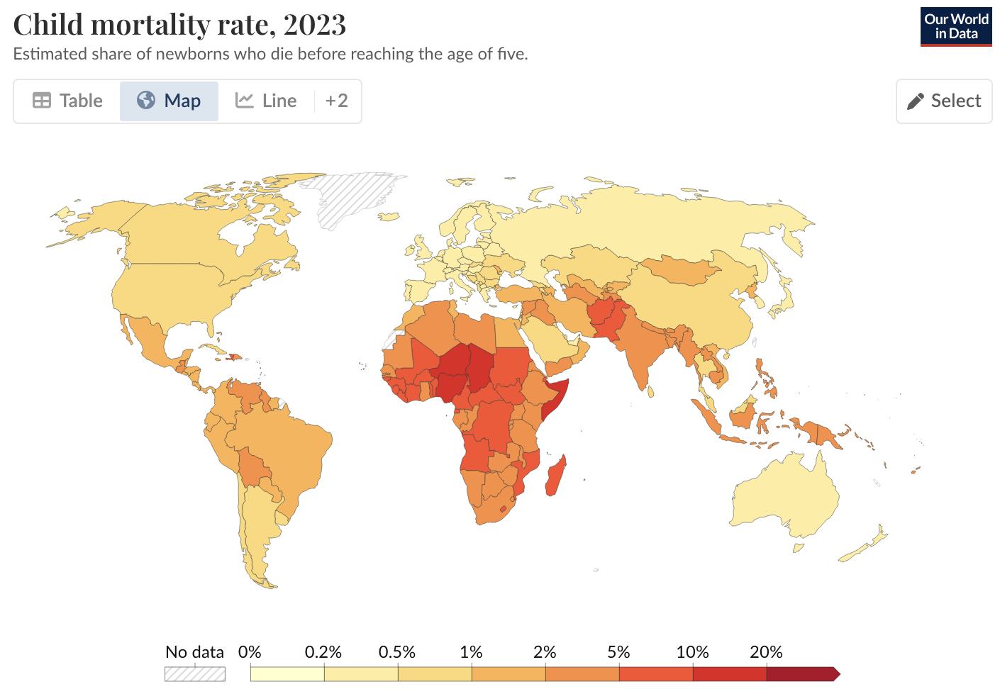

In [3]:
# Titelbild
from IPython.display import Image
Image(filename="Child mortallity rate 2023.jpg")

Quelle des Bildes https://ourworldindata.org/child-mortality#all-charts

### 1.4 Daten beschaffen und laden

In [4]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [5]:
#CSV Import
import pandas as pd

df = pd.read_csv("child-mortality.csv")
df.head()

,Entity,Code,Year,Child mortality rate
0,Afghanistan,AFG,1957,37.13
1,Afghanistan,AFG,1958,36.52
2,Afghanistan,AFG,1959,35.95
3,Afghanistan,AFG,1960,35.32
4,Afghanistan,AFG,1961,34.76


## 2. Daten vorbereiten 
- Die Daten sind bereits im Long-Format
- Die Namen der Spalten und Zeilen wurden von Englisch auf Deutsch geändert, die Ländername wurde nicht geändert.
- Die Spalte Codes wird nicht verwendet daher wurde Sie nicht in die Pivottabelle mit aufgenommen.
- In der Tabelle kann man nach unten und nach rechts scrollen, die erste Zeile und Spalte ist fixiert

In [6]:
#Gebiet auf Deutsch umbenennen
df = df.rename(columns={'Entity': 'Gebiet'})

In [8]:
#Rohdatenbeschaffung wieviele Gebiete(Ländern,Regionen,Kontinente) sind vorhanden
anzahl_gebiete = df["Gebiet"].nunique()
print ("Anzahl verschiedener Gebiete:", df["Gebiet"].nunique())

Anzahl verschiedener Gebiete: 213


Im Datensatz sind 213 Gebiete (Länder/Regionen/Kontinente/Einkommengruppenbeurteilungen)

In [9]:
#HTML Lesbare Datei erstellen und Anzahl Datenpunkte zählen
from IPython.display import HTML

jahr_counts = df["Year"].value_counts().sort_index()

HTML(f"""
<div style='height:300px; overflow-y:scroll; border:1px solid #ccc; padding:5px;'>
{jahr_counts.to_frame("Anzahl Datenpunkte").to_html()}
</div>
""")

,Anzahl Datenpunkte
Year,
1751,1
1752,1
1753,1
1754,1
1755,1
1756,1
1757,1
1758,1
1759,1


Ab 2010 sind es immer 212 Datensätze

In [10]:
# Anzahl Datenpunkte pro Gebiet
gebiet_counts = df["Gebiet"].value_counts()
gebiet_counts

Gebiet
Sweden        273
World         224
France        208
Austria       190
Belgium       190
             ... 
San Marino     39
Anguilla       39
Nauru          39
Monaco         39
Andorra        39
Name: count, Length: 213, dtype: int64

In [11]:
anzahl_ch = df[df["Gebiet"] == "Switzerland"].shape[0]
print(f"Die Schweiz hat {anzahl_ch} Datensätze.")



Die Schweiz hat 148 Datensätze.


Schweden hat seit 1751 Dateneinträge was insgesamt 273 Datensätze und somit am meisten

In [12]:
# Anzahl Datenpunkte pro Jahr (sortiert nach Jahr)
jahr_counts = df["Year"].value_counts().sort_index()
jahr_counts

Year
1751      1
1752      1
1753      1
1754      1
1755      1
       ... 
2019    212
2020    212
2021    212
2022    212
2023    212
Name: count, Length: 273, dtype: int64

In [13]:
# Anzahl Gebiete pro Jahr
gebiete_pro_jahr = df.groupby("Year")["Gebiet"].nunique()

# Gesamtzahl aller Gebiete
anzahl_gebiete = df["Gebiet"].nunique()

# Ab wann sind alle Daten vollständig?
jahr_vollstaendig = gebiete_pro_jahr[gebiete_pro_jahr == anzahl_gebiete]

jahr_vollstaendig



Year
1985    213
1986    213
1987    213
1988    213
1989    213
1990    213
1991    213
1992    213
1993    213
1994    213
1995    213
1996    213
1997    213
1998    213
1999    213
2000    213
2001    213
2002    213
2003    213
2004    213
2005    213
2006    213
2007    213
2008    213
2009    213
2010    213
Name: Gebiet, dtype: int64

Ab 1985 bis 2010 213 Datensätze vorhanden

In [14]:
# Jahr als int festlegen
df["Year"] = df["Year"].astype(int)

# für jedes Gebiet das letzte Jahr mit Daten bestimmen
last_year_per_country = df.groupby("Gebiet")["Year"].max()

# Länder, die bis 2010 Daten haben, aber kein Jahr > 2010
countries_stop_2010 = last_year_per_country[last_year_per_country == 2010]
print(countries_stop_2010)


Gebiet
Taiwan    2010
Name: Year, dtype: int64


Taiwan hat ab 2010 keine Daten mehr, daher ab 2010 noch 212 Daten

In [15]:
#Pivottabelle erstellen zum scrollen
from IPython.display import HTML
import pandas as pd

def build_child_mortality_pivot(df):
    # Spalten vereinheitlichen
    df = df.rename(columns={
        "Entity": "Gebiet",
        "Year": "Jahr",
        "Child mortality rate": "Kindersterblichkeit"})
    
    # Pivot erzeugen
    pivot = df.pivot(
        index="Jahr",
        columns="Gebiet",
        values="Kindersterblichkeit")
    
    # HTML generieren
    html = pivot.to_html()
    
    # Sticky first row & first column + scroll
    html = """
    <div style="height:600px; width:100%; overflow:auto; border:1px solid #ccc;">
    <style>
        /* Erste Spalte fixieren */
        th:nth-child(1), td:nth-child(1) {
            position: sticky;
            left: 0;
            background: black;
            z-index: 2;
        }
        /* Erste Zeile fixieren */
        thead th {
            position: sticky;
            top: 0;
            background: black;
            z-index: 3;
        }
        table {
            border-collapse: collapse;
        }
        th, td {
            padding: 4px 8px;
            border: 1px solid #ddd;
        }
    </style>
    """ + html + "</div>"
    
    return HTML(html)

# --- AUSGABE ---
build_child_mortality_pivot(df)

Gebiet,Afghanistan,Africa,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,British Virgin Islands,Brunei,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo,Cook Islands,Costa Rica,Cote d'Ivoire,Croatia,Cuba,Cyprus,Czechia,Democratic Republic of Congo,Denmark,Djibouti,Dominica,Dominican Republic,East Timor,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Eswatini,Ethiopia,Europe,European Union (27),Fiji,Finland,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,High-income countries,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Low-income countries,Lower-middle-income countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Marshall Islands,Mauritania,Mauritius,Mexico,Micronesia (country),Moldova,Monaco,Mongolia,Montenegro,Montserrat,Morocco,Mozambique,Myanmar,Namibia,Nauru,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,Niue,North America,North Korea,North Macedonia,Norway,Oceania,Oman,Pakistan,Palau,Palestine,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Qatar,Romania,Russia,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,San Marino,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Solomon Islands,Somalia,South Africa,South America,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Tonga,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Turks and Caicos Islands,Tuvalu,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Upper-middle-income countries,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,World,Yemen,Zambia,Zimbabwe
Jahr,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1751,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

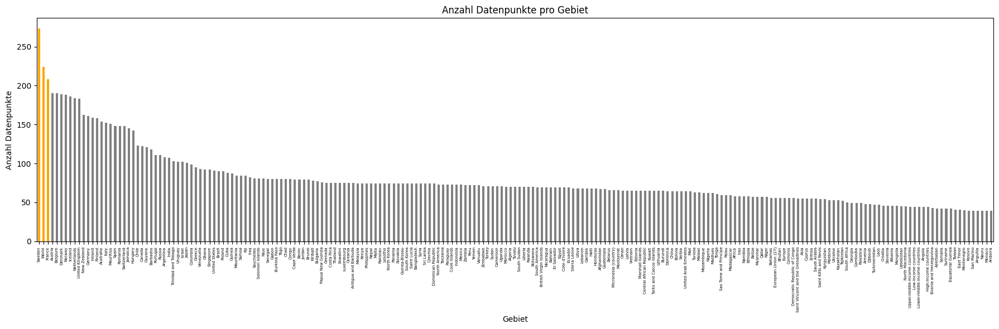

In [16]:
#matplot zur grafoischen Darstellung improtieren
import matplotlib.pyplot as plt

# Datenpunkte pro Gebiet
counts = df["Gebiet"].value_counts()

# Farbliste erstellen: orange wenn >200, sonst grau
colors = ["orange" if val > 200 else "grey" for val in counts]

plt.figure(figsize=(18, 6))
ax = counts.plot(
    kind="bar",
    color=colors,          # Farben anwenden
    title="Anzahl Datenpunkte pro Gebiet"
)

# X-Achse formatieren
ax.set_xticklabels(counts.index, rotation=90, fontsize=5)

plt.xlabel("Gebiet")
plt.ylabel("Anzahl Datenpunkte")
plt.tight_layout()
plt.show()

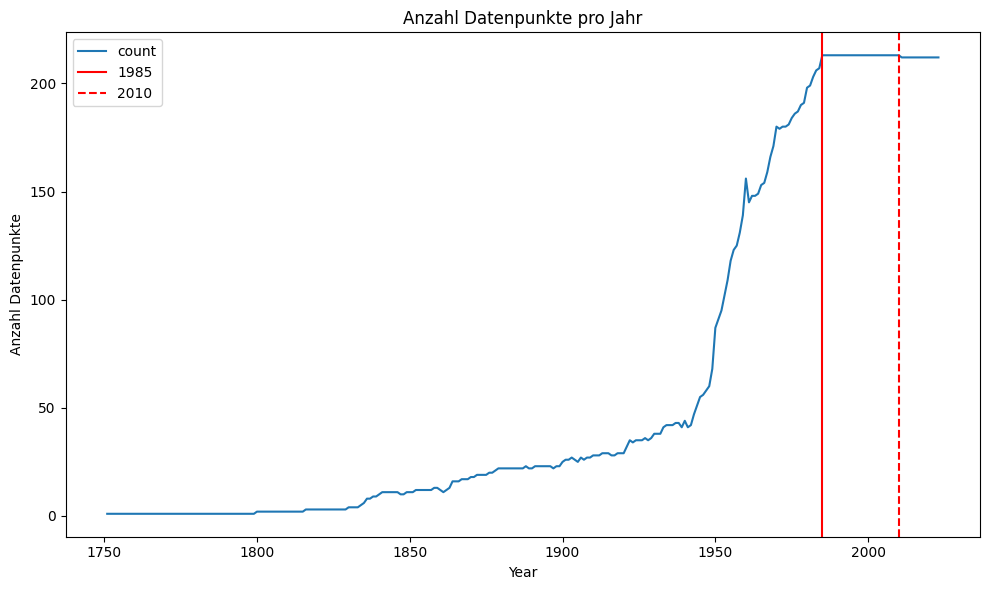

In [17]:
#Darstellung der Datenpunkte (Rohdatenanalyse)
plt.figure(figsize=(10, 6))

g = df["Year"].value_counts().sort_index().plot(
    ylabel="Anzahl Datenpunkte",
    title="Anzahl Datenpunkte pro Jahr"
)

# rote vertikale Linien für maximale Datenpunktsätze
plt.axvline(x=1985, color="red", label="1985")
plt.axvline(x=2010, color="red", linestyle="--", label="2010")

plt.legend()
plt.tight_layout()
plt.show()


#Bezüglich der ersten Frage habe wir folgenden Code verwendet um die fünf markenten Globalen (Ausschläge und Brüche ) herauszufinden. Die Beurteilung und garfische Darstellung der Daten wird unter Datenanalyse dargestellt und beurteilt

In [33]:
from tabulate import tabulate

# Kopie und Datentypen sauber setzen
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Welt extrahieren
world = df_plot[df_plot["country"] == "World"].sort_values("Year")

# Jahr-zu-Jahr-Veränderung berechnen
world["change"] = world["mortality_rate"].diff()

# Fünf stärkste Rückgänge (größte Verbesserungen)
top5_declines = (
    world.nsmallest(5, "change")[["Year", "change"]]
    .reset_index(drop=True)
)

# Fünf stärkste Anstiege (schlimmste Verschlechterungen)
top5_increases = (
    world.nlargest(5, "change")[["Year", "change"]]
    .reset_index(drop=True)
)

# Funktion: Land mit höchster Sterblichkeit in einem Jahr
def top_land_fuer_jahr(jahr):
    subset = (
        df_plot[df_plot["Year"] == jahr]
        .sort_values("mortality_rate", ascending=False)
        [["country", "mortality_rate"]]
        .head(1)
        .reset_index(drop=True)
    )
    return subset.iloc[0]["country"], subset.iloc[0]["mortality_rate"]

# Ausgabe der Top-Listen in schöner Tabellenform
def tabellen_ausgabe(df_data, titel):
    print(f"\n{titel}\n")
    print(tabulate(df_data, headers=df_data.columns, tablefmt="fancy_grid", showindex=False))


# Tabellen anzeigen (Rückgänge + Anstiege)
tabellen_ausgabe(top5_declines, "Top 5 Rückgänge (größte globale Verbesserungen)")
tabellen_ausgabe(top5_increases, "Top 5 Anstiege (schlimmste globale Verschlechterungen)")


# Zusätzliche Ausgabe: Jahr + Land mit der höchsten Sterblichkeit im jeweiligen Jahr
print("\nDetaillierte Informationen zu den extremsten Änderungen:\n")

print("Größte Verbesserungen:")
for _, row in top5_declines.iterrows():
    jahr = int(row["Year"])
    land, rate = top_land_fuer_jahr(jahr)
    print(f"- Jahr {jahr}: stärkster Rückgang weltweit; Land mit höchster Sterblichkeit = {land} ({rate})")

print("\nSchlimmste Verschlechterungen:")
for _, row in top5_increases.iterrows():
    jahr = int(row["Year"])
    land, rate = top_land_fuer_jahr(jahr)
    print(f"- Jahr {jahr}: stärkster Anstieg weltweit; Land mit höchster Sterblichkeit = {land} ({rate})")



Top 5 Rückgänge (größte globale Verbesserungen)

╒════════╤══════════╕
│   Year │   change │
╞════════╪══════════╡
│   1919 │     -1.9 │
├────────┼──────────┤
│   1962 │     -1.8 │
├────────┼──────────┤
│   1961 │     -1.4 │
├────────┼──────────┤
│   1920 │     -1.3 │
├────────┼──────────┤
│   1935 │     -1.2 │
╘════════╧══════════╛

Top 5 Anstiege (schlimmste globale Verschlechterungen)

╒════════╤══════════╕
│   Year │   change │
╞════════╪══════════╡
│   1918 │      2.3 │
├────────┼──────────┤
│   1852 │      0.5 │
├────────┼──────────┤
│   1854 │      0.5 │
├────────┼──────────┤
│   1880 │      0.5 │
├────────┼──────────┤
│   1892 │      0.4 │
╘════════╧══════════╛

Detaillierte Informationen zu den extremsten Änderungen:

Größte Verbesserungen:
- Jahr 1919: stärkster Rückgang weltweit; Land mit höchster Sterblichkeit = Barbados (57.16)
- Jahr 1962: stärkster Rückgang weltweit; Land mit höchster Sterblichkeit = Mali (47.15)
- Jahr 1961: stärkster Rückgang weltweit; Land mit höchst

Hier kann das Jahr eingegeben werden für welches die 10 höchsten Sterblichkeitsraten in dem gewählten Jahr aufwiesen

In [47]:
from tabulate import tabulate

def zeige_top_und_bottom_fuer_jahr(jahr):
    # Daten für das Jahr filtern
    subset = df_plot[df_plot["Year"] == jahr][["country", "mortality_rate"]]

    if subset.empty:
        print(f"Für das Jahr {jahr} sind keine Daten im Datensatz vorhanden.")
        return

    # Top 10 mit höchster Sterblichkeit
    top10_high = (
        subset.sort_values("mortality_rate", ascending=False)
        .head(10)
        .reset_index(drop=True)
    )
    top10_high.insert(0, "Rang", range(1, len(top10_high) + 1))

    # Top 10 mit niedrigster Sterblichkeit
    top10_low = (
        subset.sort_values("mortality_rate", ascending=True)
        .head(10)
        .reset_index(drop=True)
    )
    top10_low.insert(0, "Rang", range(1, len(top10_low) + 1))

    # Tabellen formatieren
    tabelle_high = tabulate(
        top10_high,
        headers=["Rang", "Land", "Kindersterblichkeit"],
        tablefmt="fancy_grid",
        showindex=False
    )

    tabelle_low = tabulate(
        top10_low,
        headers=["Rang", "Land", "Kindersterblichkeit"],
        tablefmt="fancy_grid",
        showindex=False
    )

    print(f"\nTop 10 Länder mit HÖCHSTER Kindersterblichkeit im Jahr {jahr}:\n")
    print(tabelle_high)

    print(f"\nTop 10 Länder mit NIEDRIGSTER Kindersterblichkeit im Jahr {jahr}:\n")
    print(tabelle_low)


def frage_jahr_und_zeige_top_und_bottom():
    try:
        jahr = int(input("Bitte Jahr eingeben (z.B. 1950 oder 2020): "))
    except ValueError:
        print("Ungültige Eingabe. Bitte eine ganze Zahl eingeben.")
        return

    if jahr not in df_plot["Year"].unique():
        print(f"Das Jahr {jahr} existiert nicht im Datensatz.")
        return

    zeige_top_und_bottom_fuer_jahr(jahr)


Folgende Funkition laufen lassen und Jahr auswählen

In [49]:
frage_jahr_und_zeige_top_und_bottom()



Top 10 Länder mit HÖCHSTER Kindersterblichkeit im Jahr 2020:

╒════════╤══════════════════════════╤═══════════════════════╕
│   Rang │ Land                     │   Kindersterblichkeit │
╞════════╪══════════════════════════╪═══════════════════════╡
│      1 │ Central African Republic │                 12.26 │
├────────┼──────────────────────────┼───────────────────────┤
│      2 │ Niger                    │                 12.06 │
├────────┼──────────────────────────┼───────────────────────┤
│      3 │ Somalia                  │                 11.44 │
├────────┼──────────────────────────┼───────────────────────┤
│      4 │ Nigeria                  │                 11.44 │
├────────┼──────────────────────────┼───────────────────────┤
│      5 │ Chad                     │                 11.1  │
├────────┼──────────────────────────┼───────────────────────┤
│      6 │ Sierra Leone             │                 10.51 │
├────────┼──────────────────────────┼───────────────────────┤
│      

Hier möchten wir die herausgefilternten Länder noch grafisch darstellen

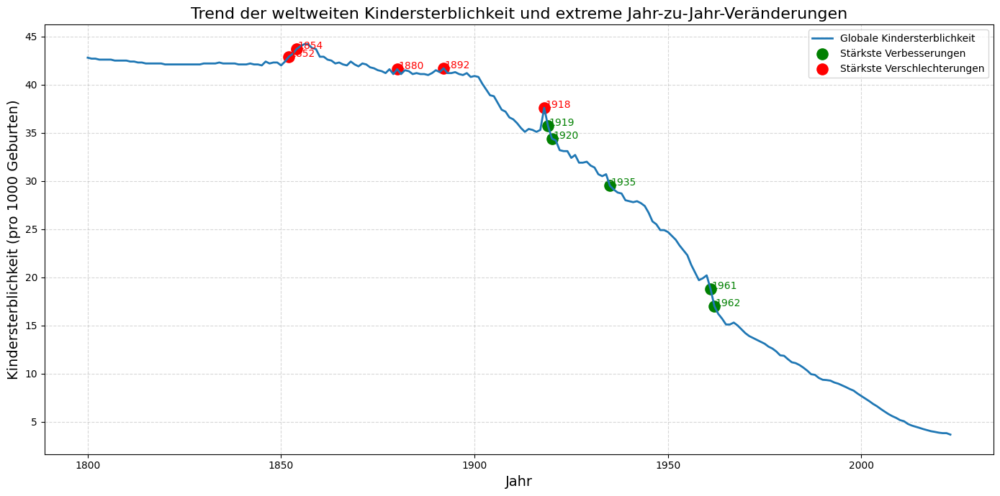

In [38]:
import matplotlib.pyplot as plt

# Welt-Daten neu extrahieren
world = df_plot[df_plot["country"] == "World"].sort_values("Year")
world["change"] = world["mortality_rate"].diff()

# Top 5 Verbesserungen (negativste Veränderungen)
top5_declines = world.nsmallest(5, "change")
# Top 5 Verschlechterungen (positivste Veränderungen)
top5_increases = world.nlargest(5, "change")

plt.figure(figsize=(14, 7))

# Grundtrend plotten
plt.plot(world["Year"], world["mortality_rate"], label="Globale Kindersterblichkeit", linewidth=2)

# Verbesserungen (größte Rückgänge)
plt.scatter(
    top5_declines["Year"],
    top5_declines["mortality_rate"],
    color="green",
    s=120,
    label="Stärkste Verbesserungen"
)

# Verschlechterungen (größte Anstiege)
plt.scatter(
    top5_increases["Year"],
    top5_increases["mortality_rate"],
    color="red",
    s=120,
    label="Stärkste Verschlechterungen"
)

# Textlabels für die Punkte
for _, row in top5_declines.iterrows():
    plt.text(row["Year"] + 0.3, row["mortality_rate"], f"{int(row['Year'])}", color="green")

for _, row in top5_increases.iterrows():
    plt.text(row["Year"] + 0.3, row["mortality_rate"], f"{int(row['Year'])}", color="red")

plt.title("Trend der weltweiten Kindersterblichkeit und extreme Jahr-zu-Jahr-Veränderungen", fontsize=16)
plt.xlabel("Jahr", fontsize=14)
plt.ylabel("Kindersterblichkeit (pro 1000 Geburten)", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


In [37]:
from tabulate import tabulate

def zeige_laender_fuer_jahr(jahr):
    # Daten auswählen und sortieren
    subset = (
        df_plot[df_plot["Year"] == jahr]
        .sort_values("mortality_rate", ascending=False)
        [["country", "mortality_rate"]]
        .head(10)
        .reset_index(drop=True)
    )

    # Schöne Tabelle erzeugen
    tabelle = tabulate(
        subset,
        headers=["Land", "Kindersterblichkeit"],
        tablefmt="fancy_grid",
        showindex=False
    )

    print(f"\nLänder mit höchster Kindersterblichkeit im Jahr {jahr}:\n")
    print(tabelle)


In [30]:
zeige_laender_fuer_jahr(1950)
zeige_laender_fuer_jahr(2020)



Länder mit höchster Kindersterblichkeit im Jahr 1950:

╒══════════════╤═══════════════════════╕
│ Land         │   Kindersterblichkeit │
╞══════════════╪═══════════════════════╡
│ North Korea  │                 46.32 │
├──────────────┼───────────────────────┤
│ Burkina Faso │                 38.05 │
├──────────────┼───────────────────────┤
│ Pakistan     │                 37.22 │
├──────────────┼───────────────────────┤
│ South Korea  │                 36.01 │
├──────────────┼───────────────────────┤
│ Guinea       │                 35.82 │
├──────────────┼───────────────────────┤
│ Iraq         │                 35.52 │
├──────────────┼───────────────────────┤
│ Benin        │                 35.16 │
├──────────────┼───────────────────────┤
│ Bangladesh   │                 34.77 │
├──────────────┼───────────────────────┤
│ Nepal        │                 34.09 │
├──────────────┼───────────────────────┤
│ Senegal      │                 33.63 │
╘══════════════╧═══════════════════════╛



In [31]:
from tabulate import tabulate

def zeige_laender_mit_niedrigster_rate(jahr):
    # Daten auswählen und sortieren (aufsteigend!)
    subset = (
        df_plot[df_plot["Year"] == jahr]
        .sort_values("mortality_rate", ascending=True)
        [["country", "mortality_rate"]]
        .head(10)
        .reset_index(drop=True)
    )

    # Tabelle formatieren
    tabelle = tabulate(
        subset,
        headers=["Land", "Kindersterblichkeit"],
        tablefmt="fancy_grid",
        showindex=False
    )

    print(f"\nLänder mit niedrigster Kindersterblichkeit im Jahr {jahr}:\n")
    print(tabelle)


In [32]:
zeige_laender_mit_niedrigster_rate(1950)
zeige_laender_mit_niedrigster_rate(2020)



Länder mit niedrigster Kindersterblichkeit im Jahr 1950:

╒════════════════╤═══════════════════════╕
│ Land           │   Kindersterblichkeit │
╞════════════════╪═══════════════════════╡
│ Sweden         │                  2.71 │
├────────────────┼───────────────────────┤
│ Iceland        │                  3.06 │
├────────────────┼───────────────────────┤
│ Australia      │                  3.16 │
├────────────────┼───────────────────────┤
│ Netherlands    │                  3.19 │
├────────────────┼───────────────────────┤
│ Norway         │                  3.28 │
├────────────────┼───────────────────────┤
│ Denmark        │                  3.41 │
├────────────────┼───────────────────────┤
│ New Zealand    │                  3.55 │
├────────────────┼───────────────────────┤
│ United Kingdom │                  3.66 │
├────────────────┼───────────────────────┤
│ United States  │                  3.76 │
├────────────────┼───────────────────────┤
│ Switzerland    │                  3.

#Jährliche globale Kindersterblichkeitsrate im Balkendiagram

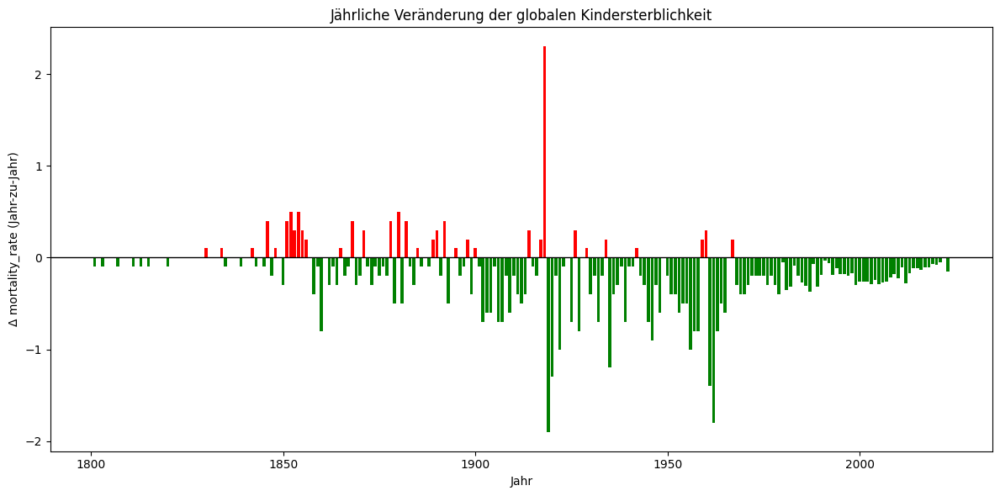

In [24]:
import matplotlib.pyplot as plt

df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Welt filtern
world = df_plot[df_plot["country"] == "World"].sort_values("Year")

# Jahr-zu-Jahr Veränderung berechnen
world["change"] = world["mortality_rate"].diff()

plt.figure(figsize=(12,6))

# Balkendiagramm
colors = ["red" if x > 0 else "green" for x in world["change"]]  # rot = Anstieg, grün = Rückgang

plt.bar(world["Year"], world["change"], color=colors)

plt.axhline(0, color="black", linewidth=1)
plt.title("Jährliche Veränderung der globalen Kindersterblichkeit")
plt.xlabel("Jahr")
plt.ylabel("Δ mortality_rate (Jahr-zu-Jahr)")
plt.tight_layout()
plt.show()


# Übersicht aller Länder

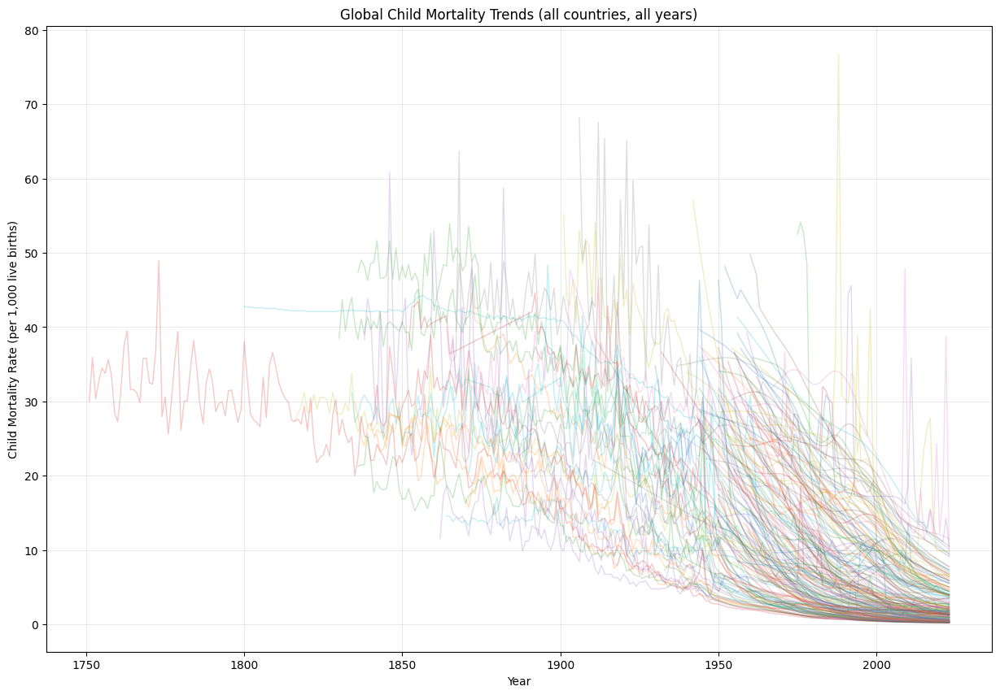

In [17]:
# Ab hier wird noch angepasst noch nicht definitiv
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("child-mortality.csv")

# Wichtige Spalten vereinheitlichen
df = df.rename(columns={
    "Entity": "country",
    "Child mortality rate": "mortality_rate"
})

plt.figure(figsize=(15, 10))

for country, sub in df.groupby("country"):
    plt.plot(sub["Year"], sub["mortality_rate"], alpha=0.25, linewidth=1)

plt.title("Global Child Mortality Trends (all countries, all years)")
plt.xlabel("Year")
plt.ylabel("Child Mortality Rate (per 1,000 live births)")
plt.grid(True, linewidth=0.4, alpha=0.5)
plt.show()

In [19]:
import pandas as pd

df = pd.read_csv("child-mortality.csv")

df = df.rename(columns={
    "Entity": "country",
    "Child mortality rate": "mortality_rate"
})

countries = [
    "Switzerland",
    "Norway",
    "Canada",
    "United States",
    "Nigeria",
    "Cambodia",
    "China",
    "Japan"
]

df_sel = df[df["country"].isin(countries)].copy()
df_sel = df_sel.sort_values(["country", "Year"])

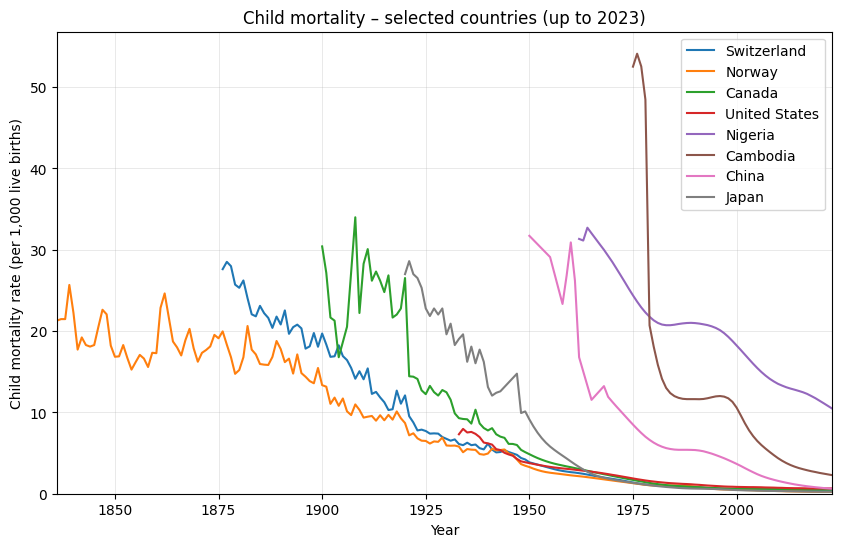

In [20]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

years = sorted(df_sel["Year"].unique())

fig, ax = plt.subplots(figsize=(10, 6))

lines = {}
for c in countries:
    # leere Linie für jedes Land anlegen
    (line,) = ax.plot([], [], label=c)
    lines[c] = line

ax.set_xlim(min(years), max(years))
ax.set_ylim(0, df_sel["mortality_rate"].max() * 1.05)
ax.set_xlabel("Year")
ax.set_ylabel("Child mortality rate (per 1,000 live births)")
ax.legend()
ax.grid(True, linewidth=0.4, alpha=0.5)

def init():
    for line in lines.values():
        line.set_data([], [])
    return list(lines.values())

def update(frame_idx):
    year = years[frame_idx]
    for c in countries:
        sub = df_sel[(df_sel["country"] == c) & (df_sel["Year"] <= year)]
        lines[c].set_data(sub["Year"], sub["mortality_rate"])
    ax.set_title(f"Child mortality – selected countries (up to {year})")
    return list(lines.values())

ani = FuncAnimation(
    fig,
    update,
    frames=len(years),
    init_func=init,
    blit=True,
    interval=200,   # ms pro Frame – höher = langsamer
)

HTML(ani.to_jshtml())

# 5. Analyse der Daten 

#### 5.1. Welche fünf markanten globalen „Brüche“ (Ausschläge und starke Rückgänge) in der Kindersterblichkeit lassen sich im 20. und 21. Jahrundert identifizieren und wie hängen diese "Brüche" mit konkreten historischen Ereignissen zusammen?


##### 5.1.1. 1918 – Spanische Grippe (Peak) 
Weltweite Influenza Pandemie:
Urspung des Namens stammt aus Spanien, da sie während dem 1. Weltkrieg neutral über die Pandemie berichtete. 
Tatsächlichen Ausbruch stammt aus der USA. 
Unglücklicherweise sind keine Daten über die meist betroffenen Ländern vorhanden. 


In [20]:
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Welt extrahieren
world = df_plot[df_plot["country"] == "World"].sort_values("Year")

# Jahr-zu-Jahr-Veränderung berechnen
world["change"] = world["mortality_rate"].diff()

# Fünf stärkste Rückgänge
top5_declines = world.nsmallest(5, "change")[["Year", "change"]]

# Fünf stärkste Anstiege
top5_increases = world.nlargest(5, "change")[["Year", "change"]]

print("Top 5 Rückgänge (größte Verbesserungen):")
print(top5_declines)

print("\nTop 5 Anstiege (schlimmste Verschlechterungen):")
print(top5_increases)



Top 5 Rückgänge (größte Verbesserungen):
       Year  change
16515  1919    -1.9
16558  1962    -1.8
16557  1961    -1.4
16516  1920    -1.3
16531  1935    -1.2

Top 5 Anstiege (schlimmste Verschlechterungen):
       Year  change
16514  1918     2.3
16448  1852     0.5
16450  1854     0.5
16476  1880     0.5
16488  1892     0.4


In [21]:
def zeige_laender_fuer_jahr(jahr):
    subset = df_plot[df_plot["Year"] == jahr].sort_values("mortality_rate", ascending=False)
    print(f"\nLänder mit höchster Kindersterblichkeit im Jahr {jahr}:")
    print(subset[["country", "mortality_rate"]].head(10))

# Rückgänge
for _, row in top5_declines.iterrows():
    zeige_laender_fuer_jahr(int(row["Year"]))

# Anstiege
for _, row in top5_increases.iterrows():
    zeige_laender_fuer_jahr(int(row["Year"]))



Länder mit höchster Kindersterblichkeit im Jahr 1919:
         country  mortality_rate
1247    Barbados           57.16
2921       Chile           49.69
6826       India           36.41
16515      World           35.70
9451   Mauritius           34.47
6205      Guyana           30.08
12081   Portugal           29.59
13925      Spain           27.17
6528     Hungary           26.68
7591     Jamaica           26.35

Länder mit höchster Kindersterblichkeit im Jahr 1962:
            country  mortality_rate
9119           Mali           47.15
16630         Yemen           41.53
13222  Sierra Leone           37.95
8919         Malawi           35.80
13820   South Sudan           34.94
5427         Gambia           34.76
6053         Guinea           34.43
5       Afghanistan           34.23
11371          Oman           34.20
2310   Burkina Faso           33.70

Länder mit höchster Kindersterblichkeit im Jahr 1961:
            country  mortality_rate
9118           Mali           48.45
1662

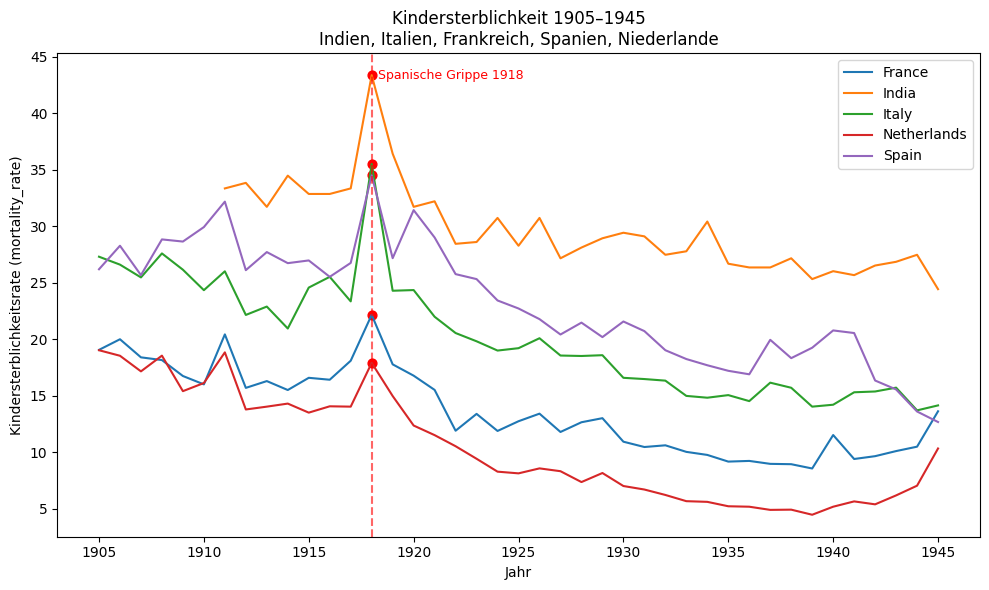

In [22]:
import matplotlib.pyplot as plt

# df hat Spalten: 'country', 'Code', 'Year', 'mortality_rate'

# 1. Vorbereitung
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Länder (über Codes) auswählen
laender_codes = ["IND", "ITA", "FRA", "ESP", "NLD"]

df_sel = df_plot[
    df_plot["Code"].isin(laender_codes) &
    df_plot["Year"].between(1905, 1945)
]

# 2. Pivot: Year als Index, Länder als Spalten
pivot = df_sel.pivot(
    index="Year",
    columns="country",
    values="mortality_rate"
)

# 3. Plot
plt.figure(figsize=(10, 6))

for country in pivot.columns:
    plt.plot(pivot.index, pivot[country], label=country)

# 4. Peak 1918 markieren
peak_year = 1918
if peak_year in pivot.index:
    for country in pivot.columns:
        y = pivot.loc[peak_year, country]
        plt.scatter(peak_year, y, s=40, color="red")
    plt.axvline(peak_year, color="red", linestyle="--", alpha=0.6)
    plt.text(
        peak_year + 0.3,
        plt.ylim()[1] * 0.95,
        "Spanische Grippe 1918",
        color="red",
        fontsize=9
    )

plt.title("Kindersterblichkeit 1905–1945\nIndien, Italien, Frankreich, Spanien, Niederlande")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()



##### 5.1.2. 1945 - Zweiter Weltkrieg
In der Grafik fällt auf, dass der Zweite Weltkrieg in vielen Ländern zu einem deutlichen Anstieg der Kindersterblichkeit führt und den vorher sinkenden Trend unterbricht. Besonders betroffene Staaten wie Russland, Deutschland oder Polen fehlen teilweise in den Daten, vermutlich aufgrund der kriegsbedingten Erfassungsprobleme. In Ländern mit vollständigen Angaben – etwa Frankreich, Belgien, Österreich oder den Niederlanden – zeigt sich dagegen ein klarer Peak. Auch Mauritius, als britische Kolonie, weist in dieser Zeit einen Anstieg auf.

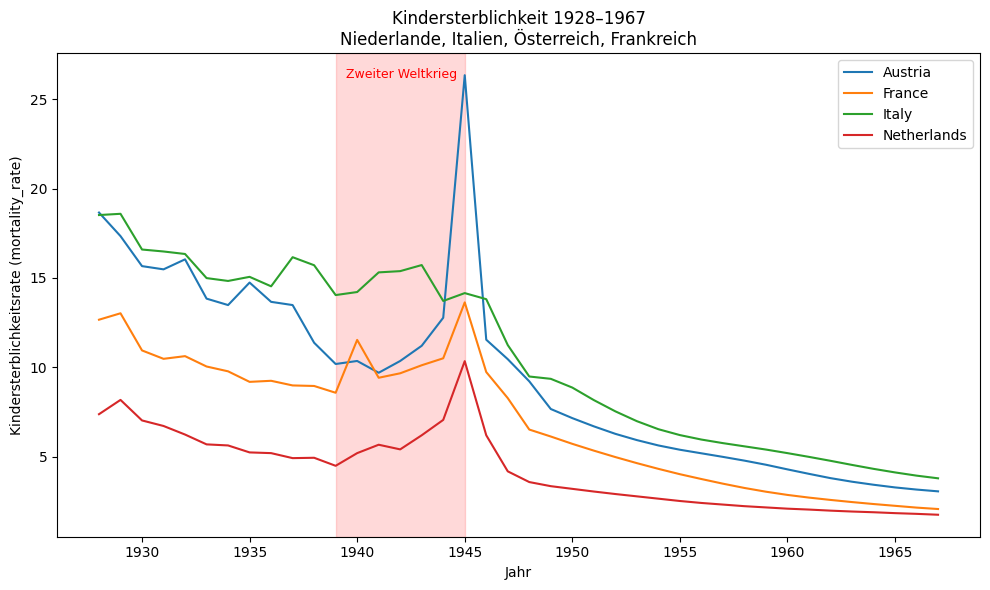

In [31]:
import matplotlib.pyplot as plt

# df hat Spalten: 'country', 'Code', 'Year', 'mortality_rate'

# 1. Vorbereitung
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Länder (über Codes)
laender_codes = ["NLD", "ITA", "AUT", "FRA"]

df_sel = df_plot[
    df_plot["Code"].isin(laender_codes) &
    df_plot["Year"].between(1928, 1967)
]

# 2. Pivot: Year als Index, Länder als Spalten
pivot = df_sel.pivot(
    index="Year",
    columns="country",
    values="mortality_rate"
)

# 3. Plot
plt.figure(figsize=(10, 6))

for country in pivot.columns:
    plt.plot(pivot.index, pivot[country], label=country)

# 4. Zweiter Weltkrieg markieren (z.B. 1939–1945)
ww2_start, ww2_end = 1939, 1945
plt.axvspan(ww2_start, ww2_end, color="red", alpha=0.15)
plt.text(
    ww2_start + 0.5,
    plt.ylim()[1] * 0.95,
    "Zweiter Weltkrieg",
    color="red",
    fontsize=9
)

plt.title("Kindersterblichkeit 1928–1967\nNiederlande, Italien, Österreich, Frankreich")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


##### 5.1.3. 1960 - Hungersnot China
In den Jahren 1959–1961 steigt die Kindersterblichkeit in China in der Grafik deutlich an. Dieser starke Anstieg hängt direkt mit der großen Hungersnot zusammen, die vor allem durch politische Fehlentscheidungen während des „Großen Sprungs nach vorn“ ausgelöst wurde. Überhöhte Erntemeldungen, zu hohe staatliche Getreideabgaben und die Zwangskollektivierung führten zu akuter Nahrungsmittelknappheit. Da Warnungen unterdrückt wurden, verschärfte sich die Versorgungskrise, was besonders Kinder stark traf und die erhöhte Kindersterblichkeit erklärt.

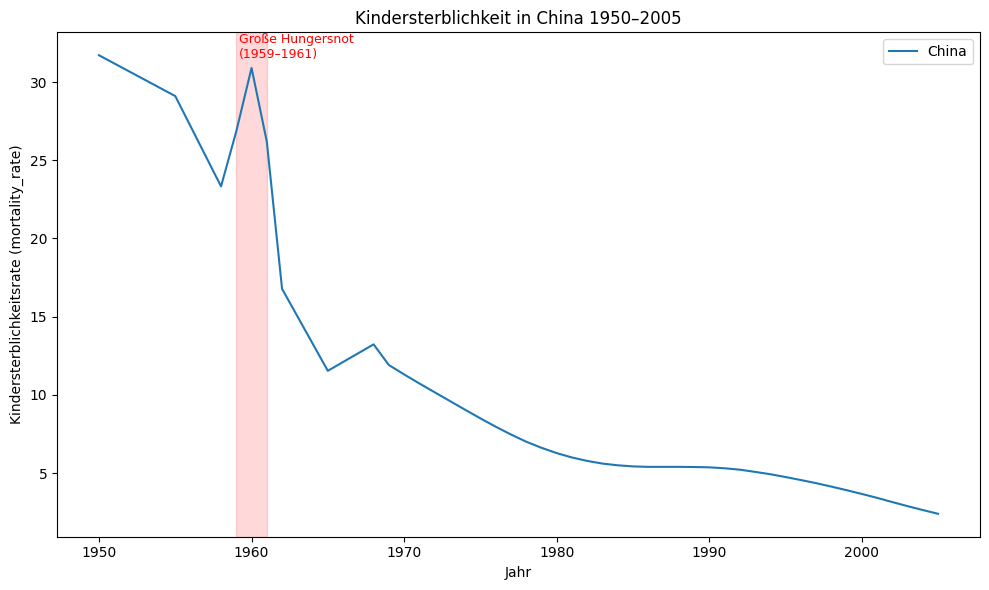

In [ ]:
import matplotlib.pyplot as plt

# Vorbereitung
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# China zwischen 1950 und 2005
china = df_plot[
    (df_plot["country"] == "China") &
    (df_plot["Year"].between(1950, 2005))
]

plt.figure(figsize=(10, 6))
plt.plot(china["Year"], china["mortality_rate"], label="China")

# Grosse Hungersnot in China (ca. 1959–1961) markieren
famine_start, famine_end = 1959, 1961
plt.axvspan(famine_start, famine_end, color="red", alpha=0.15)
plt.text(
    famine_start + 0.2,
    plt.ylim()[1] * 0.95,
    "Große Hungersnot\n(1959–1961)",
    color="red",
    fontsize=9
)

plt.title("Kindersterblichkeit in China 1950–2005")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


##### 5.1.4. ab 1950 - Massiver Rückfall
Der Graph zeigt, dass die Kindersterblichkeit ab 1950 stark sinkt. Dieser starke Rückgang hängt eng mit der breiten Einführung von Penicillin und anderen Antibiotika zusammen. Dadurch konnten häufige bakterielle Infektionen – wie Lungenentzündungen oder Blutvergiftungen – erstmals wirksam behandelt werden. Penicillin war somit ein entscheidender Faktor dafür, dass viel weniger Kinder in den späten 1940er- und 1950er-Jahren starben.

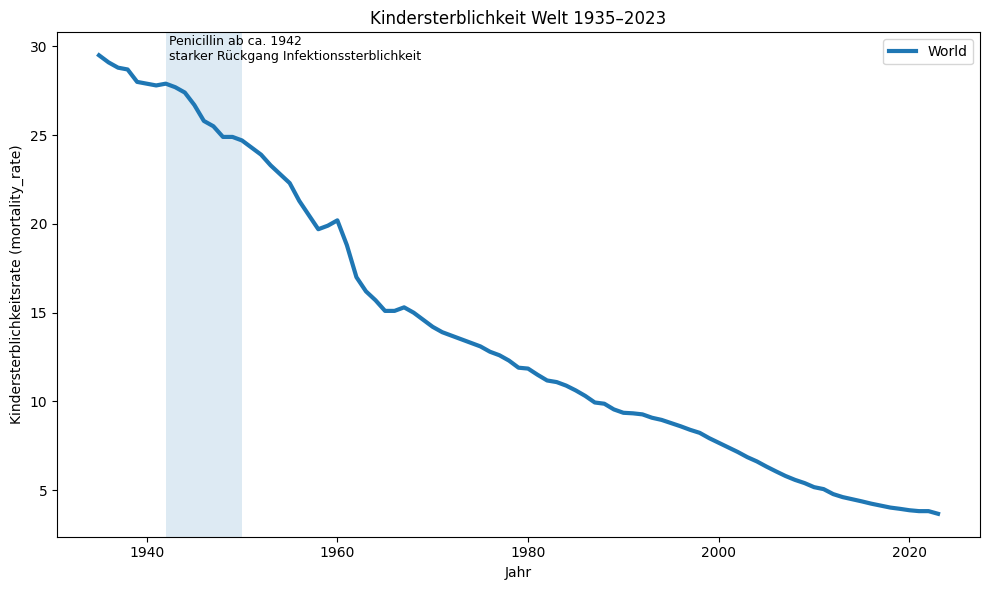

In [34]:
import matplotlib.pyplot as plt

# Kopie, Year als int
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Nur Welt 1935–2023
world = df_plot[
    (df_plot["country"] == "World") &
    (df_plot["Year"].between(1935, 2023))
]

plt.figure(figsize=(10, 6))
plt.plot(world["Year"], world["mortality_rate"], label="World", linewidth=3)

# Penicillin-Markierung (Einführung ab ca. 1942, breite Wirkung bis ca. 1950)
pen_start, pen_end = 1942, 1950
plt.axvspan(pen_start, pen_end, alpha=0.15)
plt.text(
    pen_start + 0.3,
    plt.ylim()[1] * 0.95,
    "Penicillin ab ca. 1942\nstarker Rückgang Infektionssterblichkeit",
    fontsize=9
)

plt.title("Kindersterblichkeit Welt 1935–2023")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


##### 5.1.5. 1950 - Koreakrieg
Der Graph zeigt die Kindersterblichkeit in Nord- und Südkorea zwischen 1950 und 2023. Zu Beginn der 1950er-Jahre ist sie in beiden Ländern sehr hoch, was vor allem die Folgen des Koreakriegs widerspiegelt: zerstörte Krankenhäuser, schlechte Ernährung, fehlende Hygiene und kaum medizinische Versorgung. Nach dem Ende des Kriegs 1953 sinkt die Kindersterblichkeit in beiden Staaten schnell. Nordkorea verbessert sich zunächst schneller, weil es früh Hilfe aus der Sowjetunion und China erhält. Ab Ende der 1950er-Jahre macht Südkorea jedoch stärkere Fortschritte durch internationale Unterstützung, bessere Gesundheitsprogramme und wirtschaftlichen Aufschwung. Bis 1970 liegt Südkoreas Kindersterblichkeit etwas niedriger als die Nordkoreas, und beide Länder haben ihre Werte stark reduziert. Auffällig ist, dass Nordkorea um 1994 bis fast 2005 eine erhöte sterblichkeitsrate aufwies, was auf eine Hungernot zuruückzuführen ist.

In [41]:
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

korea = df_plot[df_plot["country"].str.contains("Korea")]

jahrspanne = korea.groupby("country")["Year"].agg(["min", "max"])

print(jahrspanne)


              min   max
country                
North Korea  1950  2023
South Korea  1950  2023


['North Korea' 'South Korea']


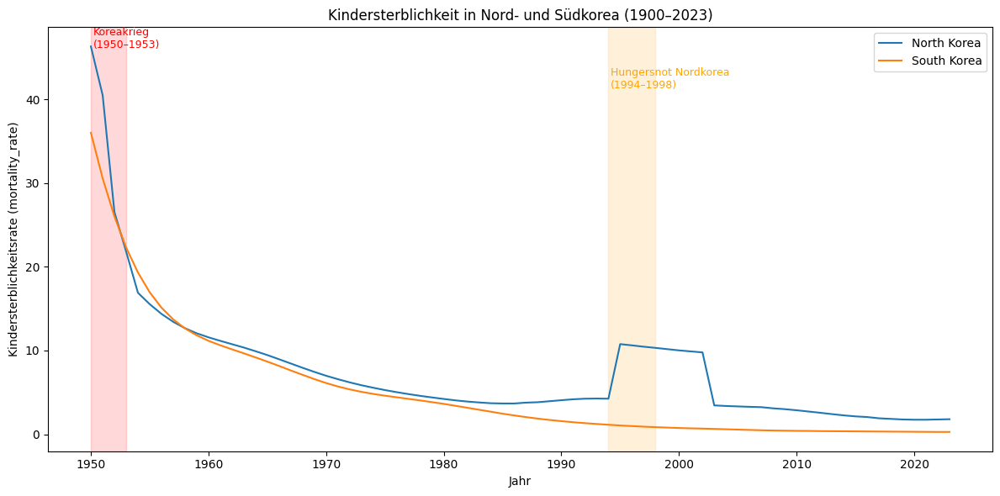

In [40]:
import matplotlib.pyplot as plt

df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

countries = ["North Korea", "South Korea"]

korea = df_plot[
    df_plot["country"].isin(countries) &
    df_plot["Year"].between(1950, 2023)
]

print(korea["country"].unique())

pivot = korea.pivot(
    index="Year",
    columns="country",
    values="mortality_rate"
)

plt.figure(figsize=(12, 6))

for country in pivot.columns:
    plt.plot(pivot.index, pivot[country], label=country)

# Koreakrieg markieren (1950–1953)
war_start, war_end = 1950, 1953
plt.axvspan(war_start, war_end, color="red", alpha=0.15)
plt.text(
    war_start + 0.2,
    plt.ylim()[1] * 0.95,
    "Koreakrieg\n(1950–1953)",
    color="red",
    fontsize=9
)

# Hungersnot in Nordkorea („Arduous March“, ca. 1994–1998)
famine_start, famine_end = 1994, 1998
plt.axvspan(famine_start, famine_end, color="orange", alpha=0.15)
plt.text(
    famine_start + 0.2,
    plt.ylim()[1] * 0.85,
    "Hungersnot Nordkorea\n(1994–1998)",
    color="orange",
    fontsize=9
)

plt.title("Kindersterblichkeit in Nord- und Südkorea (1900–2023)")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


#### 5.2. Wie hängen Kindersterblichkeitsrate und Geburtenrate auf kontinentaler Ebene zusammen und wie verändert sich dieser Zusammenhang im Zeitverlauf?

#### 5.3. Wie stark unterscheiden sich die Kindersterblichkeitsraten innerhalb der Kontinente und wie hat sich diese innerkontinentale Ungleichheit im Laufe der Zeit verändert?

##### 5.3.1. Kontinentaler Vergleich
Der Graph zeigt, dass die Kindersterblichkeit in allen Kontinenten seit 1968 stark gesunken ist, aber große Unterschiede bestehen. Afrika hat durchgehend die höchsten Werte, während Europa, Nordamerika und Australien sehr niedrige Kindersterblichkeit aufweisen. Asien und Südamerika haben große Fortschritte gemacht und liegen heute im mittleren Bereich.
Begründung: Die Unterschiede entstehen vor allem durch verschiedene Gesundheitsversorgung, wirtschaftliche Entwicklung, Impfprogramme, Ernährungssituation und politische Stabilität. Wohlhabende Regionen haben bessere Medizin und Infrastruktur, während viele afrikanische Länder weniger Zugang zu Versorgung, sauberem Wasser und Impfungen haben.

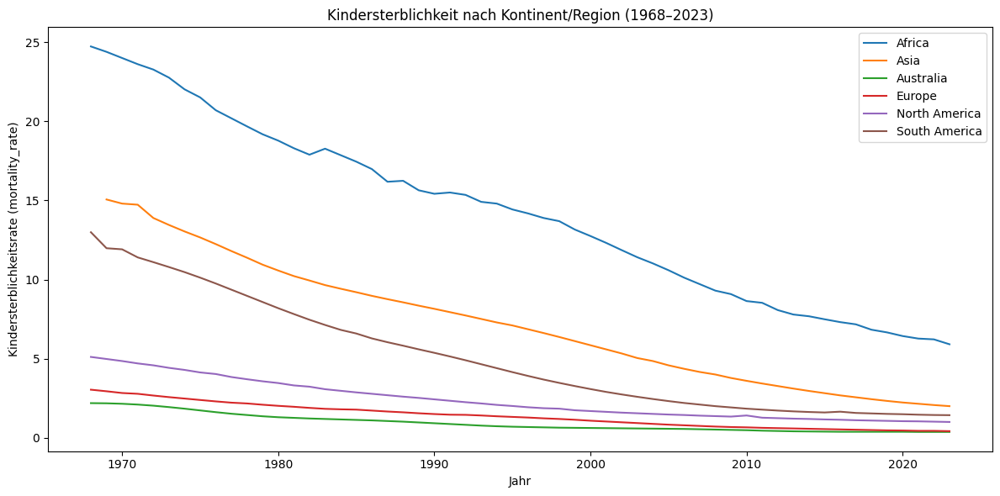

In [42]:
import matplotlib.pyplot as plt

# Kopie, Year als int
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Regionen / Kontinente
regions = [
    "Africa",
    "Asia",
    "South America",
    "North America",
    "Europe",
    "Australia"   # falls dein Datensatz statt Australia z.B. 'Oceania' hat, hier anpassen
]

# Filtern
df_sel = df_plot[
    df_plot["country"].isin(regions) &
    df_plot["Year"].between(1968, 2023)
]

# Pivot: Year = Index, Regionen = Spalten
pivot = df_sel.pivot(
    index="Year",
    columns="country",
    values="mortality_rate"
)

plt.figure(figsize=(12, 6))

for region in pivot.columns:
    plt.plot(pivot.index, pivot[region], label=region)

plt.title("Kindersterblichkeit nach Kontinent/Region (1968–2023)")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


#### 5.4. Wie stellt sich das in der Schweiz dar (Fragestellung 1 und 2)?

##### 5.4.1. Peaks und Rückfälle in der Schweiz
Peaks (Anstiege der Kindersterblichkeit)

    ##1    Ende 1800 / um 1880–1900

    ◦    Hohe Kindersterblichkeit wegen Armut, mangelnder Hygiene und schlechter medizinischer Versorgung.

    ◦    Viele Kinder starben an Infektionen wie Durchfall, Lungenentzündung oder Masern.


    ##2    Um 1918–1920 (Grippepandemie)

    ◦    Die Spanische Grippe führte zu einem sichtbaren Anstieg der Todesfälle, auch bei Säuglingen und Kleinkindern.


    3    Kleinere Peaks in den frühen 1900ern

    ◦    Wiederkehrende Masern-, Keuchhusten- und Diphtherie-Epidemien.

    ◦    Kinder waren am stärksten betroffen, da noch keine Impfstoffe existierten.


 ###Abfälle (starke Rückgänge der Kindersterblichkeit)

    ##1    1900–1920: Erste Verbesserungen

    ◦    Bessere Wasserqualität, Kanalisation, Hygieneerziehung.

    ◦    Gründung öffentlicher Gesundheitsdienste.

    ◦    Beginn deutlich sinkender Infektionsraten.


    ##2    1920–1945: Medizinischer Fortschritt

    ◦    Einführung von Impfungen (z. B. gegen Diphtherie ab den 1920ern).

    ◦    Antibiotika wie Penicillin (ab den 1940ern) retten viele Kinderleben.

    ◦    Bessere Mütter- und Säuglingspflege.


    ##3    1950–1980: Wohlstandsanstieg und moderne Medizin

    ◦    Ausbau des Gesundheitssystems und Krankenhäuser.

    ◦    Regelmäßige Impfprogramme.

    ◦    Verbesserte Ernährung und Lebensstandard.


    ##4    Seit 1980: Extrem niedrige Werte

    ◦    Hochentwickelte Neonatalmedizin.

    ◦    Sehr gute Schwangerschafts- und Geburtsbetreuung.

    ◦    Kaum noch Todesfälle durch Infektionen dank Impfungen und Antibiotika.


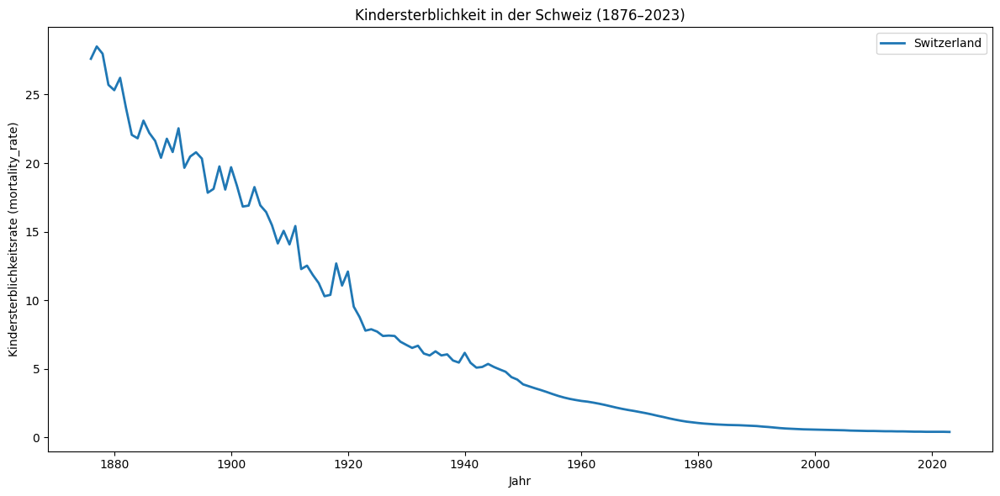

In [43]:
import matplotlib.pyplot as plt

# Kopie, Year als int
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Schweiz filtern
ch = df_plot[
    (df_plot["country"] == "Switzerland") &
    (df_plot["Year"].between(1876, 2023))
]

plt.figure(figsize=(12, 6))

plt.plot(ch["Year"], ch["mortality_rate"], label="Switzerland", linewidth=2)

plt.title("Kindersterblichkeit in der Schweiz (1876–2023)")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeitsrate (mortality_rate)")
plt.legend()
plt.tight_layout()
plt.show()


In [45]:
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

print(df_plot["country"].unique())


['Afghanistan' 'Africa' 'Albania' 'Algeria' 'Andorra' 'Angola' 'Anguilla'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Asia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'British Virgin Islands' 'Brunei' 'Bulgaria'
 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' 'Democratic Republic of Congo' 'Denmark' 'Djibouti'
 'Dominica' 'Dominican Republic' 'East Timor' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini'
 'Ethiopia' 'Europe' 'European Union (27)' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti'
 'High-income countries' 'Honduras' 'Hungar

In [48]:
df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

regions = ["Africa", "Asia", "Australia", "Europe", "North America", "South America"]

# Prüfen, ab wann die Regionen Daten haben
print(df_plot[df_plot["country"].isin(regions)].groupby("country")["Year"].agg(["min", "max"]))


                min   max
country                  
Africa         1966  2023
Asia           1969  2023
Australia      1870  2023
Europe         1968  2023
North America  1951  2023
South America  1955  2023


In [49]:
regions = ["Africa", "Asia", "Australia", "Europe", "North America", "South America"]

sub = df_plot[df_plot["country"].isin(regions)]
jahre_mit_regionen = sub.groupby("Year")["country"].nunique()

# Jahre, in denen alle sechs Regionen vertreten sind:
print(jahre_mit_regionen[jahre_mit_regionen == len(regions)].head())


Year
1969    6
1970    6
1971    6
1972    6
1973    6
Name: country, dtype: int64


## Heatmap

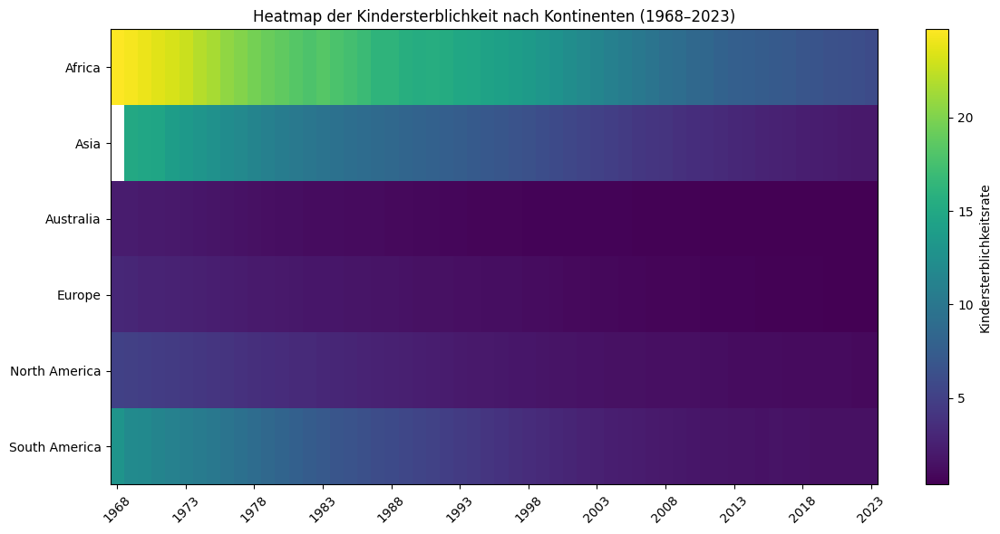

In [51]:
import matplotlib.pyplot as plt

df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

regions = ["Africa", "Asia", "Australia", "Europe", "North America", "South America"]

df_sel = df_plot[
    df_plot["country"].isin(regions) &
    df_plot["Year"].between(1968, 2023)
]

pivot = df_sel.pivot(index="Year", columns="country", values="mortality_rate")

plt.figure(figsize=(12,6))
plt.imshow(pivot.T, aspect="auto", cmap="viridis")
plt.colorbar(label="Kindersterblichkeitsrate")
plt.yticks(range(len(pivot.columns)), pivot.columns)
plt.xticks(range(0, len(pivot.index), 5), pivot.index[::5], rotation=45)
plt.title("Heatmap der Kindersterblichkeit nach Kontinenten (1968–2023)")
plt.tight_layout()
plt.show()



## Vergleich Kindersterblichkeitsrate 1950 und 2020 

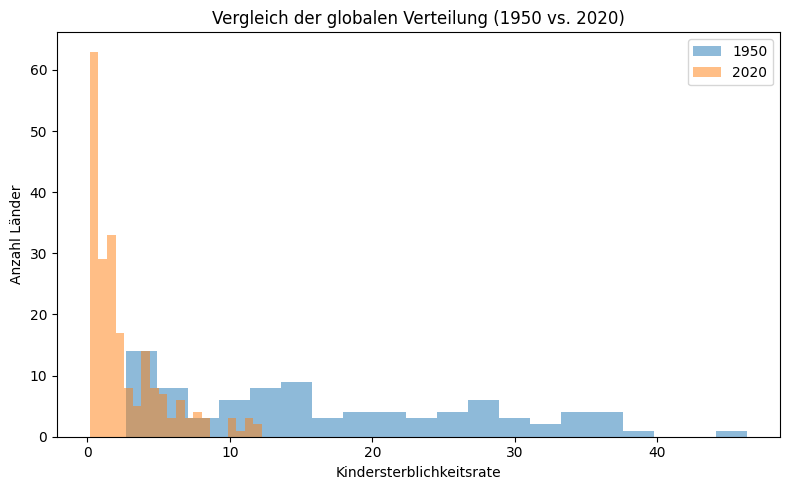

In [53]:
years = [1950, 2020]

plt.figure(figsize=(8,5))

for y in years:
    vals = df_plot[df_plot["Year"] == y]["mortality_rate"]
    plt.hist(vals, bins=20, alpha=0.5, label=str(y))

plt.title("Vergleich der globalen Verteilung (1950 vs. 2020)")
plt.xlabel("Kindersterblichkeitsrate")
plt.ylabel("Anzahl Länder")
plt.legend()
plt.tight_layout()
plt.show()


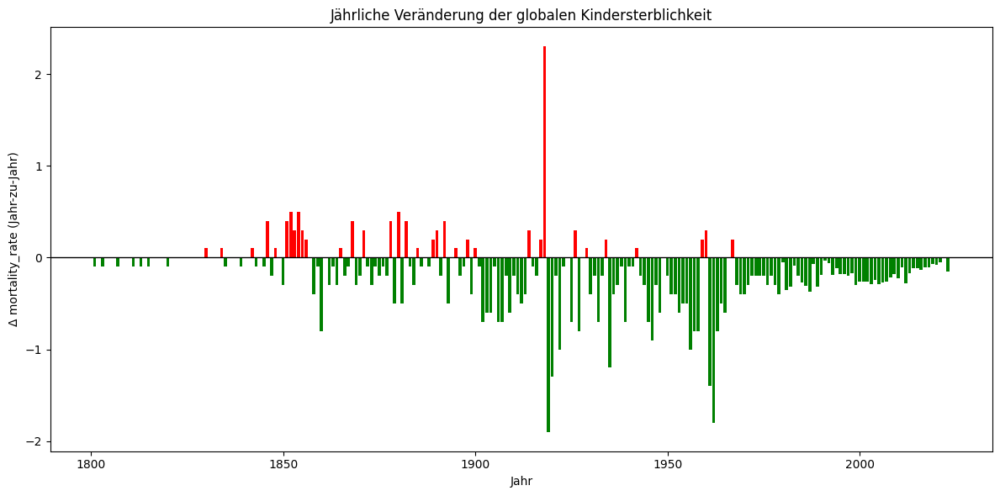

In [54]:
import matplotlib.pyplot as plt

df_plot = df.copy()
df_plot["Year"] = df_plot["Year"].astype(int)

# Welt filtern
world = df_plot[df_plot["country"] == "World"].sort_values("Year")

# Jahr-zu-Jahr Veränderung berechnen
world["change"] = world["mortality_rate"].diff()

plt.figure(figsize=(12,6))

# Balkendiagramm
colors = ["red" if x > 0 else "green" for x in world["change"]]  # rot = Anstieg, grün = Rückgang

plt.bar(world["Year"], world["change"], color=colors)

plt.axhline(0, color="black", linewidth=1)
plt.title("Jährliche Veränderung der globalen Kindersterblichkeit")
plt.xlabel("Jahr")
plt.ylabel("Δ mortality_rate (Jahr-zu-Jahr)")
plt.tight_layout()
plt.show()
